IMPORTAR A BASE DE DADOS EM CSV E IDENTIFICAR O CHARSET DO ARQUIVO

In [1]:
import pandas as pd
import chardet

with open('acidentes2024_todas_causas_tipos.csv', 'rb') as f:
    result = chardet.detect(f.read())
    encoding = result['encoding']
    print(f'Codificação detectada: {encoding}')
    
    
data = pd.read_csv('acidentes2024_todas_causas_tipos.csv', delimiter=';', encoding=encoding)


print(data.head())

Codificação detectada: ISO-8859-1
         id      pesid data_inversa     dia_semana   horario  uf     br  \
0  571772.0  1268971.0   2024-01-01  segunda-feira  00:05:00  RJ  101.0   
1  571774.0  1268985.0   2024-01-01  segunda-feira  00:05:00  GO  153.0   
2  571774.0  1268985.0   2024-01-01  segunda-feira  00:05:00  GO  153.0   
3  571777.0  1269020.0   2024-01-01  segunda-feira  01:45:00  ES  101.0   
4  571778.0  1269028.0   2024-01-01  segunda-feira  00:45:00  SC  101.0   

      km municipio causa_principal  ...       sexo  ilesos feridos_leves  \
0  272,5    TANGUA             Sim  ...  Masculino     0.0           0.0   
1  424,6  ANAPOLIS             Não  ...   Feminino     1.0           0.0   
2  424,6  ANAPOLIS             Sim  ...   Feminino     1.0           0.0   
3  264,1     SERRA             Sim  ...  Masculino     1.0           0.0   
4    110     PENHA             Não  ...  Masculino     1.0           0.0   

  feridos_graves mortos      latitude     longitude region

VISUALIZAR AS INFORMAÇÕES BÁSICAS DOS DADOS E DAS COLUNAS

In [2]:
print(data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 343412 entries, 0 to 343411
Data columns (total 37 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   id                      343412 non-null  float64
 1   pesid                   309888 non-null  float64
 2   data_inversa            343412 non-null  object 
 3   dia_semana              343412 non-null  object 
 4   horario                 343412 non-null  object 
 5   uf                      343412 non-null  object 
 6   br                      342588 non-null  float64
 7   km                      342588 non-null  object 
 8   municipio               343412 non-null  object 
 9   causa_principal         343412 non-null  object 
 10  causa_acidente          343412 non-null  object 
 11  ordem_tipo_acidente     343412 non-null  int64  
 12  tipo_acidente           343412 non-null  object 
 13  classificacao_acidente  343409 non-null  object 
 14  fase_dia            

MOSTRAR AS ESTATÍSTICAS PRELIMINARES DOS DADOS

In [3]:
print(data.describe())

                  id         pesid             br  ordem_tipo_acidente  \
count  343412.000000  3.098880e+05  342588.000000        343412.000000   
mean   595677.616076  1.327972e+06     216.686641             1.738137   
std     13688.428005  3.328831e+04     126.744896             0.981022   
min    571772.000000  1.268971e+06      10.000000             1.000000   
25%    583348.000000  1.298572e+06     116.000000             1.000000   
50%    596061.000000  1.328496e+06     163.000000             1.000000   
75%    607592.000000  1.356871e+06     330.000000             2.000000   
max    621831.000000  1.392166e+06     495.000000            10.000000   

         id_veiculo  ano_fabricacao_veiculo          idade         ilesos  \
count  3.320510e+05           332051.000000  280129.000000  309888.000000   
mean   1.063764e+06             1903.986490      39.947696       0.407628   
std    2.633828e+04              456.283085      41.979165       0.491394   
min    1.018215e+06      

VERIFICAR QUAIS COLUNAS POSSUEM CAMPOS EM BRANCO OU NULOS

In [4]:
data.isnull().sum()

id                            0
pesid                     33524
data_inversa                  0
dia_semana                    0
horario                       0
uf                            0
br                          824
km                          824
municipio                     0
causa_principal               0
causa_acidente                0
ordem_tipo_acidente           0
tipo_acidente                 0
classificacao_acidente        3
fase_dia                      0
sentido_via                   0
condicao_metereologica        0
tipo_pista                    0
tracado_via                   0
uso_solo                      0
id_veiculo                11361
tipo_veiculo              11361
marca                         0
ano_fabricacao_veiculo    11361
tipo_envolvido            33524
estado_fisico             33524
idade                     63283
sexo                      33524
ilesos                    33524
feridos_leves             33524
feridos_graves            33524
mortos  

LIMPAR AS LINHAS QUE POSSUAM CAMPOS EM BRANCO OU NULOS POR COLUNA

In [5]:
data_cleaned = data.dropna(subset=['classificacao_acidente', 'uop', 'delegacia', 'regional', 'tipo_envolvido', 'ano_fabricacao_veiculo', 'tipo_veiculo', 'id_veiculo', 'km', 'idade', 'br', 'pesid'])

CONFIRMAR SE AINDA HÁ ALGUM CAMPO EM BRANCO OU NULO

In [6]:
data_cleaned.isnull().sum()

id                        0
pesid                     0
data_inversa              0
dia_semana                0
horario                   0
uf                        0
br                        0
km                        0
municipio                 0
causa_principal           0
causa_acidente            0
ordem_tipo_acidente       0
tipo_acidente             0
classificacao_acidente    0
fase_dia                  0
sentido_via               0
condicao_metereologica    0
tipo_pista                0
tracado_via               0
uso_solo                  0
id_veiculo                0
tipo_veiculo              0
marca                     0
ano_fabricacao_veiculo    0
tipo_envolvido            0
estado_fisico             0
idade                     0
sexo                      0
ilesos                    0
feridos_leves             0
feridos_graves            0
mortos                    0
latitude                  0
longitude                 0
regional                  0
delegacia           

MÉDIA DAS IDADES DAS VÍTIMAS DE ACIDENTES

In [7]:
data_cleaned['idade'].mean()

39.85084048874747

QUANTIDADE DE ACIDENTE POR TIPO

In [8]:
data_cleaned['tipo_acidente'].value_counts()

tipo_acidente
Colisão traseira                  39856
Tombamento                        39417
Queda de ocupante de veículo      36637
Saída de leito carroçável         35448
Colisão transversal               22338
Colisão com objeto                21539
Colisão lateral mesmo sentido     19972
Colisão frontal                   18941
Capotamento                       13994
Colisão lateral sentido oposto     7682
Engavetamento                      6900
Atropelamento de Pedestre          4736
Derramamento de carga              2769
Incêndio                           2393
Atropelamento de Animal            1958
Eventos atípicos                    734
Sinistro pessoal de trânsito          2
Name: count, dtype: int64

QAUNTIDADE DE ACIDENTE POR LAT LONG

In [9]:
location_distribution = data_cleaned.groupby(['latitude', 'longitude']).size().reset_index(name='num_acidentes')

print(location_distribution)


          latitude     longitude  num_acidentes
0        -0,859893    -60,519678              2
1      -0,87945925  -60,51620358              8
2        -1,065242    -46,764686             24
3      -1,06532445  -46,77747689              3
4      -1,07541058  -46,85633484             12
...            ...           ...            ...
23419   3,83878842  -51,81774523              4
23420   3,83977699  -51,82029605             18
23421   3,84033747  -51,82179523             12
23422     4,181177     -61,00885              2
23423     4,214675    -61,013405              4

[23424 rows x 3 columns]


In [10]:
location_distribution

,latitude,longitude,num_acidentes
0,"-0,859893","-60,519678",2
1,"-0,87945925","-60,51620358",8
2,"-1,065242","-46,764686",24
3,"-1,06532445","-46,77747689",3
4,"-1,07541058","-46,85633484",12
...,...,...,...
23419,"3,83878842","-51,81774523",4
23420,"3,83977699","-51,82029605",18
23421,"3,84033747","-51,82179523",12
23422,"4,181177","-61,00885",2


VISUALIZAR AS INFORMAÇÕES BÁSICAS DOS DADOS E DAS COLUNAS

In [11]:
print(data_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 275316 entries, 0 to 343411
Data columns (total 37 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   id                      275316 non-null  float64
 1   pesid                   275316 non-null  float64
 2   data_inversa            275316 non-null  object 
 3   dia_semana              275316 non-null  object 
 4   horario                 275316 non-null  object 
 5   uf                      275316 non-null  object 
 6   br                      275316 non-null  float64
 7   km                      275316 non-null  object 
 8   municipio               275316 non-null  object 
 9   causa_principal         275316 non-null  object 
 10  causa_acidente          275316 non-null  object 
 11  ordem_tipo_acidente     275316 non-null  int64  
 12  tipo_acidente           275316 non-null  object 
 13  classificacao_acidente  275316 non-null  object 
 14  fase_dia                2

TRANSFORMAR DADOS STR PARA FLOAT DAS COLUNAS DE LAT E LONG

In [12]:
data_cleaned['latitude'] = data_cleaned['latitude'].str.replace(',', '.').astype(float)
data_cleaned['longitude'] = data_cleaned['longitude'].str.replace(',', '.').astype(float)


print(data_cleaned[['latitude', 'longitude']].dtypes)

latitude     float64
longitude    float64
dtype: object


C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\1922326633.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['latitude'] = data_cleaned['latitude'].str.replace(',', '.').astype(float)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\1922326633.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['longitude'] = data_cleaned['longitude'].str.replace(',', '.').astype(float)


GERAR MAPA DE CALOR COM OS DADOS DE LAT E LONG

In [13]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [14]:
import folium
from folium.plugins import HeatMap

mapa = folium.Map(location=[-14.2350, -51.9253], zoom_start=4) 

heat_data = [[row['latitude'], row['longitude']] for index, row in data_cleaned.iterrows()]
HeatMap(heat_data).add_to(mapa)

mapa


QUANTIDADE DE ACIDADE POR LAT LONG

In [15]:

location_distribution_sorted = location_distribution.sort_values(by='num_acidentes', ascending=False)

print(location_distribution_sorted.head())


           latitude     longitude  num_acidentes
4874   -17,40682777  -41,51524967            884
11260  -23,01910606  -54,30128306            648
20215   -5,55278209  -55,82200724            600
1835     -12,682075    -45,931477            550
1417     -12,207257     -44,46697            540


In [16]:
location_distribution_sorted

,latitude,longitude,num_acidentes
4874,"-17,40682777","-41,51524967",884
11260,"-23,01910606","-54,30128306",648
20215,"-5,55278209","-55,82200724",600
1835,"-12,682075","-45,931477",550
1417,"-12,207257","-44,46697",540
...,...,...,...
16555,"-27,668911","-53,31282",1
9269,"-21,70752761","-45,37422642",1
3446,"-15,74049683","-48,57730866",1
20820,"-6,7778","-38,0488",1


QUANTIDADE DE ACIDENTE POR TIPO E LAT LONG

In [17]:

tipo_acidente_distribution = data.groupby(['latitude', 'longitude', 'tipo_acidente']).size().reset_index(name='num_acidentes')


print(tipo_acidente_distribution)


          latitude     longitude                   tipo_acidente  \
0        -0,859893    -60,519678                        Incêndio   
1      -0,87945925  -60,51620358                     Capotamento   
2      -0,87945925  -60,51620358    Queda de ocupante de veículo   
3      -0,87945925  -60,51620358       Saída de leito carroçável   
4      -0,87945925  -60,51620358                      Tombamento   
...            ...           ...                             ...   
54950   3,84033747  -51,82179523  Colisão lateral sentido oposto   
54951   3,84033747  -51,82179523       Saída de leito carroçável   
54952     4,181177     -61,00885       Saída de leito carroçável   
54953     4,214675    -61,013405              Colisão com objeto   
54954     4,214675    -61,013405       Saída de leito carroçável   

       num_acidentes  
0                  3  
1                  4  
2                  4  
3                  4  
4                  4  
...              ...  
54950              6  

In [18]:
tipo_acidente_distribution

,latitude,longitude,tipo_acidente,num_acidentes
0,"-0,859893","-60,519678",Incêndio,3
1,"-0,87945925","-60,51620358",Capotamento,4
2,"-0,87945925","-60,51620358",Queda de ocupante de veículo,4
3,"-0,87945925","-60,51620358",Saída de leito carroçável,4
4,"-0,87945925","-60,51620358",Tombamento,4
...,...,...,...,...
54950,"3,84033747","-51,82179523",Colisão lateral sentido oposto,6
54951,"3,84033747","-51,82179523",Saída de leito carroçável,6
54952,"4,181177","-61,00885",Saída de leito carroçável,5
54953,"4,214675","-61,013405",Colisão com objeto,2


CONVERTER DATAS PAR DATETIME

In [19]:
data_cleaned['data_inversa'] = pd.to_datetime(data_cleaned['data_inversa'], errors='coerce')

C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\4031216997.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['data_inversa'] = pd.to_datetime(data_cleaned['data_inversa'], errors='coerce')


In [20]:
print(data_cleaned['data_inversa'].dtypes)

datetime64[ns]


NÚMEROS DE ACIDENTES POR MÊS

In [21]:
data_cleaned['mês'] = data_cleaned['data_inversa'].dt.month
acidentes_por_mes = data_cleaned['mês'].value_counts().sort_index()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\2508687338.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['mês'] = data_cleaned['data_inversa'].dt.month


In [22]:
acidentes_por_mes

mês
1    40391
2    37168
3    37768
4    36629
5    40561
6    38491
7    44308
Name: count, dtype: int64

In [23]:
meses_dict = {
    1: 'Janeiro', 
    2: 'Fevereiro', 
    3: 'Março', 
    4: 'Abril', 
    5: 'Maio', 
    6: 'Junho', 
    7: 'Julho'
}

In [24]:
print(data_cleaned['data_inversa'])

0        2024-01-01
1        2024-01-01
2        2024-01-01
3        2024-01-01
4        2024-01-01
            ...    
343403   2024-06-22
343408   2024-07-28
343409   2024-07-28
343410   2024-07-28
343411   2024-07-28
Name: data_inversa, Length: 275316, dtype: datetime64[ns]


In [25]:
data_cleaned['mes_nome'] = data_cleaned['mês'].map(meses_dict)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\795563036.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['mes_nome'] = data_cleaned['mês'].map(meses_dict)


In [26]:
print(data_cleaned[['mês', 'mes_nome']].head())

   mês mes_nome
0    1  Janeiro
1    1  Janeiro
2    1  Janeiro
3    1  Janeiro
4    1  Janeiro


In [27]:
data_cleaned['data_inversa'] = pd.to_datetime(data_cleaned['data_inversa'], errors='coerce')

print(data_cleaned['data_inversa'])

0        2024-01-01
1        2024-01-01
2        2024-01-01
3        2024-01-01
4        2024-01-01
            ...    
343403   2024-06-22
343408   2024-07-28
343409   2024-07-28
343410   2024-07-28
343411   2024-07-28
Name: data_inversa, Length: 275316, dtype: datetime64[ns]


C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\1147266341.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['data_inversa'] = pd.to_datetime(data_cleaned['data_inversa'], errors='coerce')


In [28]:
acidentes_por_mes = data_cleaned['mes_nome'].value_counts()

In [29]:
meses_ordenados = ['Janeiro', 'Fevereiro', 'Março', 'Abril', 'Maio', 'Junho', 'Julho']
acidentes_por_mes = acidentes_por_mes.reindex(meses_ordenados)

In [30]:
acidentes_por_mes

mes_nome
Janeiro      40391
Fevereiro    37168
Março        37768
Abril        36629
Maio         40561
Junho        38491
Julho        44308
Name: count, dtype: int64

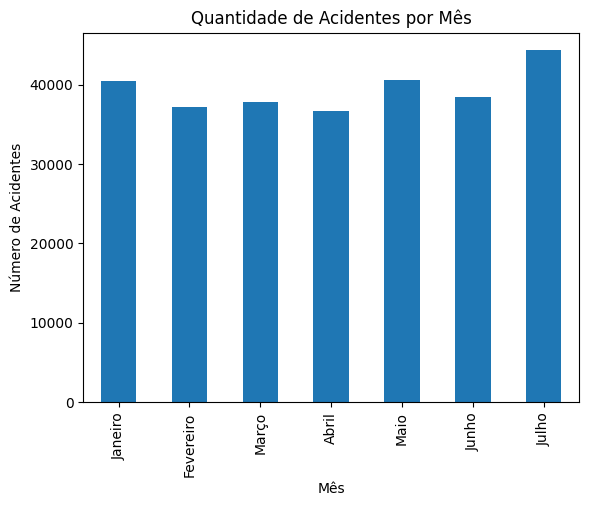

In [31]:
import matplotlib.pyplot as plt


acidentes_por_mes.plot(kind='bar')
plt.title('Quantidade de Acidentes por Mês')
plt.xlabel('Mês')
plt.ylabel('Número de Acidentes')
plt.show()


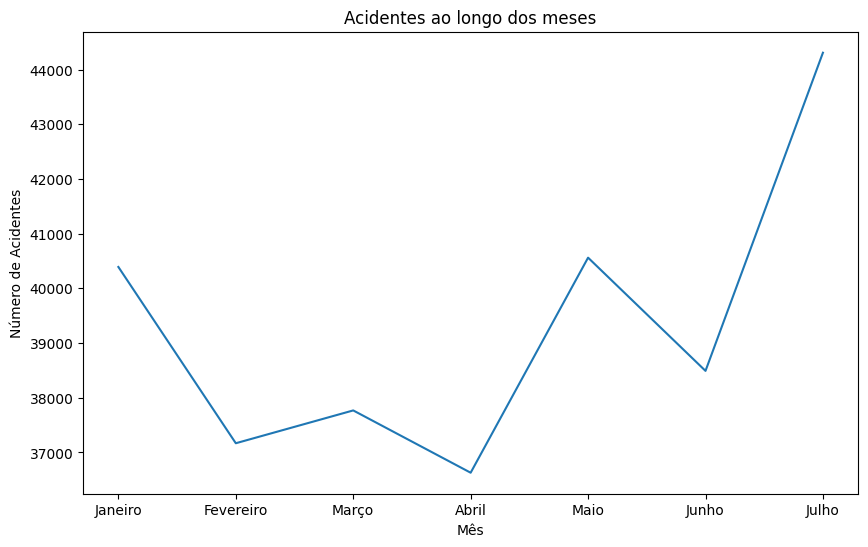

In [32]:
acidentes_por_mes.plot(kind='line', figsize=(10,6))
plt.title('Acidentes ao longo dos meses')
plt.xlabel('Mês')
plt.ylabel('Número de Acidentes')
plt.show()

NÚMERO DE ACIDENTE POR DIA DA SEMANA

In [33]:
print(data_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 275316 entries, 0 to 343411
Data columns (total 39 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      275316 non-null  float64       
 1   pesid                   275316 non-null  float64       
 2   data_inversa            275316 non-null  datetime64[ns]
 3   dia_semana              275316 non-null  object        
 4   horario                 275316 non-null  object        
 5   uf                      275316 non-null  object        
 6   br                      275316 non-null  float64       
 7   km                      275316 non-null  object        
 8   municipio               275316 non-null  object        
 9   causa_principal         275316 non-null  object        
 10  causa_acidente          275316 non-null  object        
 11  ordem_tipo_acidente     275316 non-null  int64         
 12  tipo_acidente           275316 non-

In [34]:
dias_semana_dict = {
    'segunda-feira': 'Segunda-feira', 
    'terça-feira': 'Terça-feira', 
    'quarta-feira': 'Quarta-feira', 
    'quinta-feira': 'Quinta-feira', 
    'sexta-feira': 'Sexta-feira', 
    'sábado': 'Sábado', 
    'domingo': 'Domingo'
}


data['dias_semana_nome'] = data['dia_semana'].map(dias_semana_dict)

print(data[['dia_semana', 'dias_semana_nome']].head())


      dia_semana dias_semana_nome
0  segunda-feira    Segunda-feira
1  segunda-feira    Segunda-feira
2  segunda-feira    Segunda-feira
3  segunda-feira    Segunda-feira
4  segunda-feira    Segunda-feira


In [35]:

valores_unicos = data['dia_semana'].unique()
print(valores_unicos)


['segunda-feira' 'terça-feira' 'quarta-feira' 'quinta-feira' 'sexta-feira'
 'sábado' 'domingo']


In [36]:

acidentes_por_dia = data.groupby('dia_semana').size().reset_index(name='numero_acidentes')


print(acidentes_por_dia)


      dia_semana  numero_acidentes
0        domingo             57066
1   quarta-feira             47113
2   quinta-feira             43746
3  segunda-feira             46087
4    sexta-feira             53444
5         sábado             52751
6    terça-feira             43205


C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\937291017.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='numero_acidentes', y='dia_semana', data=acidentes_por_dia, palette='Blues')


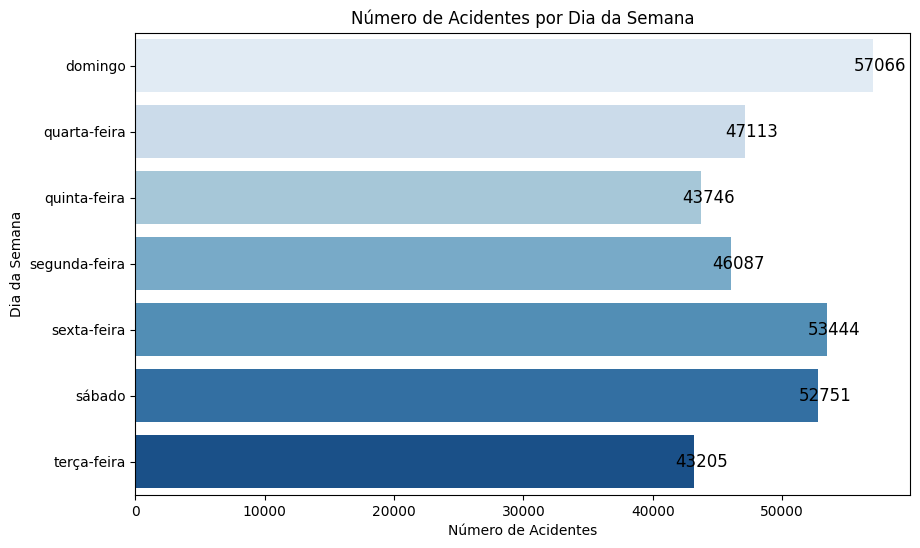

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns


acidentes_por_dia = data.groupby('dia_semana').size().reset_index(name='numero_acidentes')


plt.figure(figsize=(10, 6))
ax = sns.barplot(x='numero_acidentes', y='dia_semana', data=acidentes_por_dia, palette='Blues')
plt.title('Número de Acidentes por Dia da Semana')
plt.xlabel('Número de Acidentes')
plt.ylabel('Dia da Semana')


for p in ax.patches:
    ax.annotate(f'{int(p.get_width())}', 
                (p.get_width(), p.get_y() + p.get_height() / 2), 
                ha='center', va='center', 
                fontsize=12, color='black', 
                xytext=(5, 0), 
                textcoords='offset points')

plt.show()



NÚMERO DE ACIDENTES POR TIPO

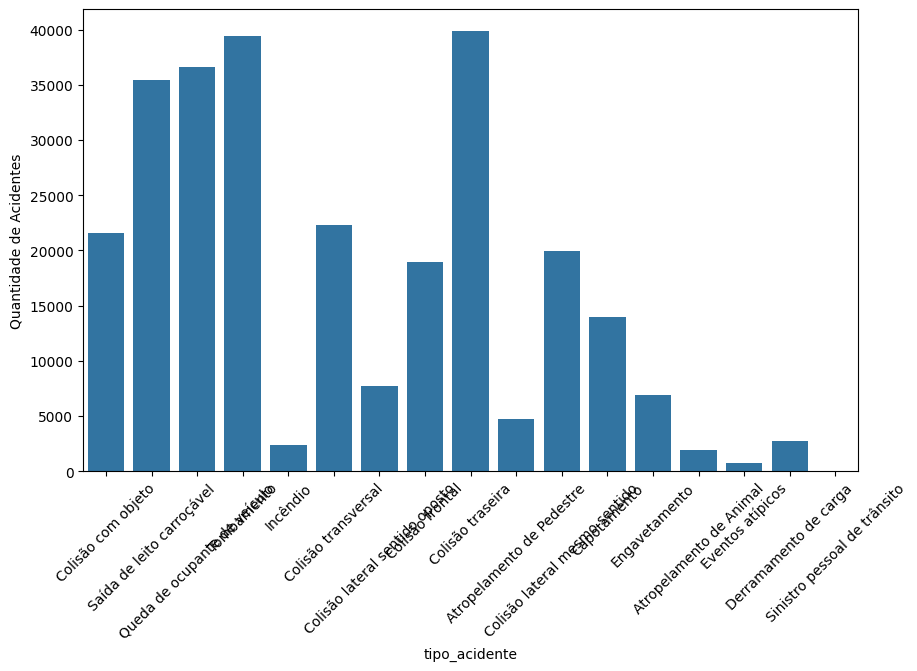

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(10,6))
sns.countplot(x='tipo_acidente', data=data_cleaned)
plt.xticks(rotation=45)
plt.ylabel('Quantidade de Acidentes')
plt.show()


ANÁLISE DE CORRELAÇÃO

In [39]:
print(data_cleaned.dtypes)

id                               float64
pesid                            float64
data_inversa              datetime64[ns]
dia_semana                        object
horario                           object
uf                                object
br                               float64
km                                object
municipio                         object
causa_principal                   object
causa_acidente                    object
ordem_tipo_acidente                int64
tipo_acidente                     object
classificacao_acidente            object
fase_dia                          object
sentido_via                       object
condicao_metereologica            object
tipo_pista                        object
tracado_via                       object
uso_solo                          object
id_veiculo                       float64
tipo_veiculo                      object
marca                             object
ano_fabricacao_veiculo           float64
tipo_envolvido  

In [40]:

colunas_numericas = data_cleaned.select_dtypes(include=['float64', 'int64', 'int32'])


print(colunas_numericas.head())


         id      pesid     br  ordem_tipo_acidente  id_veiculo  \
0  571772.0  1268971.0  101.0                    1   1018215.0   
1  571774.0  1268985.0  153.0                    1   1018226.0   
2  571774.0  1268985.0  153.0                    1   1018226.0   
3  571777.0  1269020.0  101.0                    1   1018251.0   
4  571778.0  1269028.0  101.0                    1   1018261.0   

   ano_fabricacao_veiculo  idade  ilesos  feridos_leves  feridos_graves  \
0                  2023.0   26.0     0.0            0.0             0.0   
1                  2009.0   34.0     1.0            0.0             0.0   
2                  2009.0   34.0     1.0            0.0             0.0   
3                  2009.0   55.0     1.0            0.0             0.0   
4                  2011.0   53.0     1.0            0.0             0.0   

   mortos   latitude  longitude  mês  
0     1.0 -22.729360 -42.701125    1  
1     0.0 -16.229185 -49.009797    1  
2     0.0 -16.229185 -49.009797    

In [41]:
colunas_numericas

,id,pesid,br,ordem_tipo_acidente,id_veiculo,ano_fabricacao_veiculo,idade,ilesos,feridos_leves,feridos_graves,mortos,latitude,longitude,mês
0,571772.0,1268971.0,101.0,1,1018215.0,2023.0,26.0,0.0,0.0,0.0,1.0,-22.729360,-42.701125,1
1,571774.0,1268985.0,153.0,1,1018226.0,2009.0,34.0,1.0,0.0,0.0,0.0,-16.229185,-49.009797,1
2,571774.0,1268985.0,153.0,1,1018226.0,2009.0,34.0,1.0,0.0,0.0,0.0,-16.229185,-49.009797,1
3,571777.0,1269020.0,101.0,1,1018251.0,2009.0,55.0,1.0,0.0,0.0,0.0,-20.172928,-40.267364,1
4,571778.0,1269028.0,101.0,1,1018261.0,2011.0,53.0,1.0,0.0,0.0,0.0,-26.834770,-48.706151,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343403,621808.0,1392053.0,251.0,1,1114529.0,0.0,74.0,0.0,1.0,0.0,0.0,-16.475060,-43.500301,6
343408,621831.0,1392136.0,316.0,1,1114569.0,2009.0,34.0,0.0,1.0,0.0,0.0,-9.588771,-35.887005,7
343409,621831.0,1392135.0,316.0,1,1114569.0,2009.0,38.0,0.0,0.0,1.0,0.0,-9.588771,-35.887005,7
343410,621831.0,1392136.0,316.0,1,1114569.0,2009.0,34.0,0.0,1.0,0.0,0.0,-9.588771,-35.887005,7


In [42]:
print(colunas_numericas.dtypes)

id                        float64
pesid                     float64
br                        float64
ordem_tipo_acidente         int64
id_veiculo                float64
ano_fabricacao_veiculo    float64
idade                     float64
ilesos                    float64
feridos_leves             float64
feridos_graves            float64
mortos                    float64
latitude                  float64
longitude                 float64
mês                         int32
dtype: object


In [43]:

colunas_mortos_idade_acidente = data_cleaned[['idade', 'mortos', 'ordem_tipo_acidente']]


correlacao_especifica = colunas_mortos_idade_acidente.corr()


print(correlacao_especifica)


                        idade    mortos  ordem_tipo_acidente
idade                1.000000  0.003613            -0.011215
mortos               0.003613  1.000000             0.078594
ordem_tipo_acidente -0.011215  0.078594             1.000000


In [44]:
correlacao_especifica

,idade,mortos,ordem_tipo_acidente
idade,1.000000,0.003613,-0.011215
mortos,0.003613,1.000000,0.078594
ordem_tipo_acidente,-0.011215,0.078594,1.000000


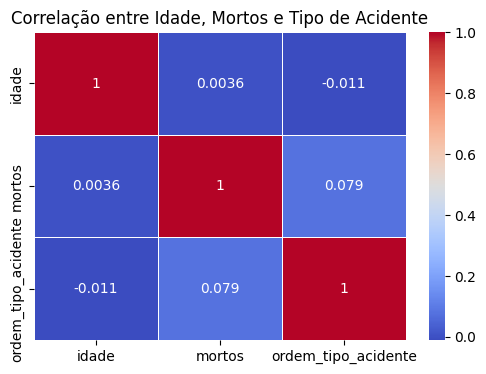

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(6, 4))
sns.heatmap(correlacao_especifica, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlação entre Idade, Mortos e Tipo de Acidente')
plt.show()


NÚMERO DE MORTOS POR BR

In [46]:

mortos_por_br = data_cleaned.groupby('br')['mortos'].sum().reset_index()


print(mortos_por_br)


        br  mortos
0     10.0   203.0
1     20.0   240.0
2     30.0    11.0
3     40.0   386.0
4     50.0    71.0
..     ...     ...
104  485.0     0.0
105  487.0     5.0
106  488.0     0.0
107  493.0     9.0
108  495.0     0.0

[109 rows x 2 columns]


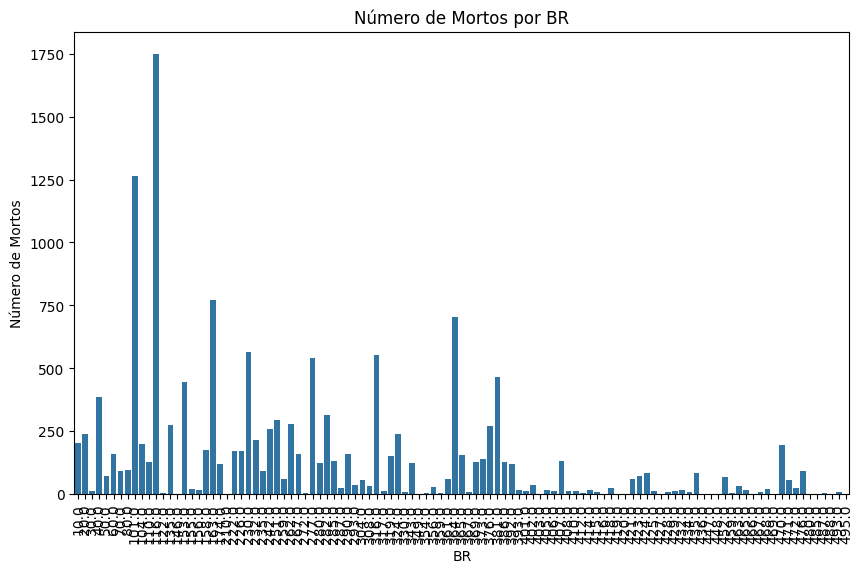

In [47]:

plt.figure(figsize=(10, 6))
sns.barplot(x='br', y='mortos', data=mortos_por_br)
plt.title('Número de Mortos por BR')
plt.xlabel('BR')
plt.ylabel('Número de Mortos')
plt.xticks(rotation=90)  
plt.show()


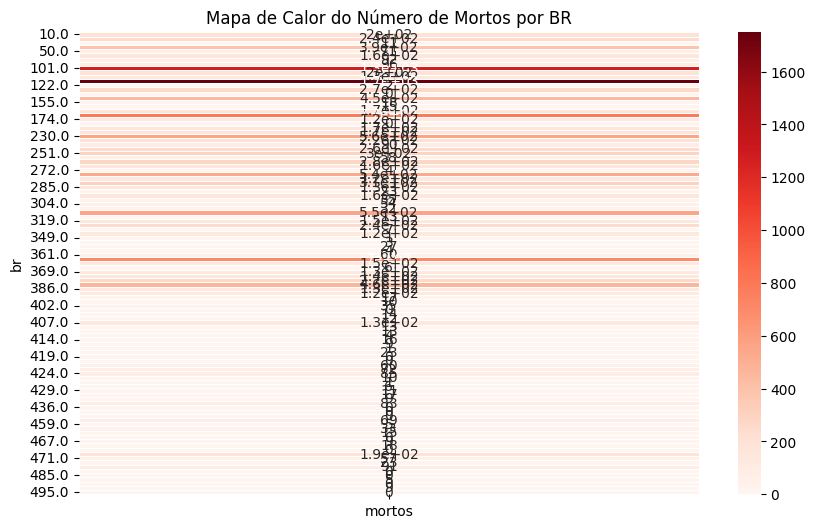

In [48]:

plt.figure(figsize=(10, 6))
sns.heatmap(mortos_por_br.pivot_table(index='br', values='mortos'), annot=True, cmap='Reds', linewidths=0.5)
plt.title('Mapa de Calor do Número de Mortos por BR')
plt.show()


C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\4010549568.py:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


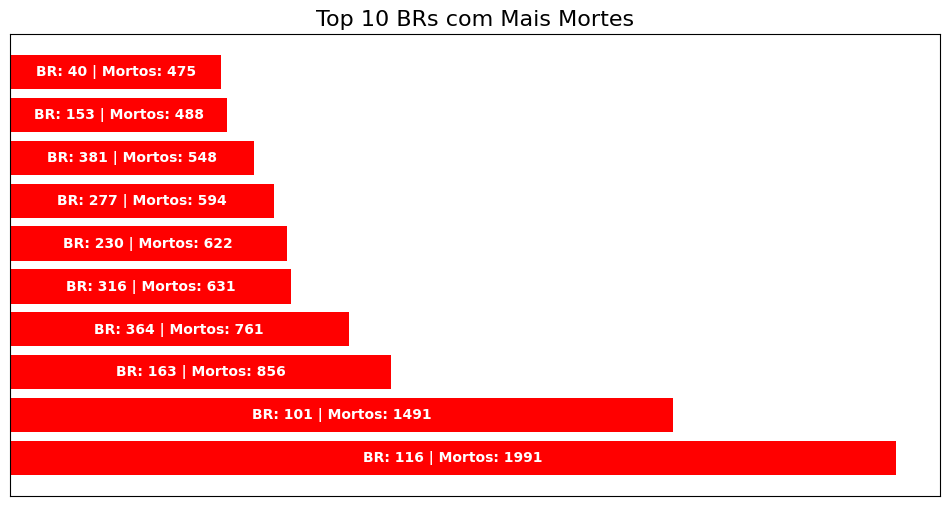

In [49]:
import matplotlib.pyplot as plt


mortos_por_br = data.groupby('br')['mortos'].sum().reset_index()


top_br = mortos_por_br.sort_values(by='mortos', ascending=False).head(10)


plt.figure(figsize=(12, 6))


for i, row in enumerate(top_br.itertuples()):
    plt.barh(i, row.mortos, color='red')
    plt.text(row.mortos / 2, i, f'BR: {int(row.br)} | Mortos: {int(row.mortos)}', va='center', ha='center', color='white', fontweight='bold')


plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)


plt.title('Top 10 BRs com Mais Mortes', fontsize=16)


plt.tight_layout()
plt.show()



C:\Users\Usuario\AppData\Local\Temp\ipykernel_21272\709677584.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='br', y='mortos', data=top_br, palette='Reds')


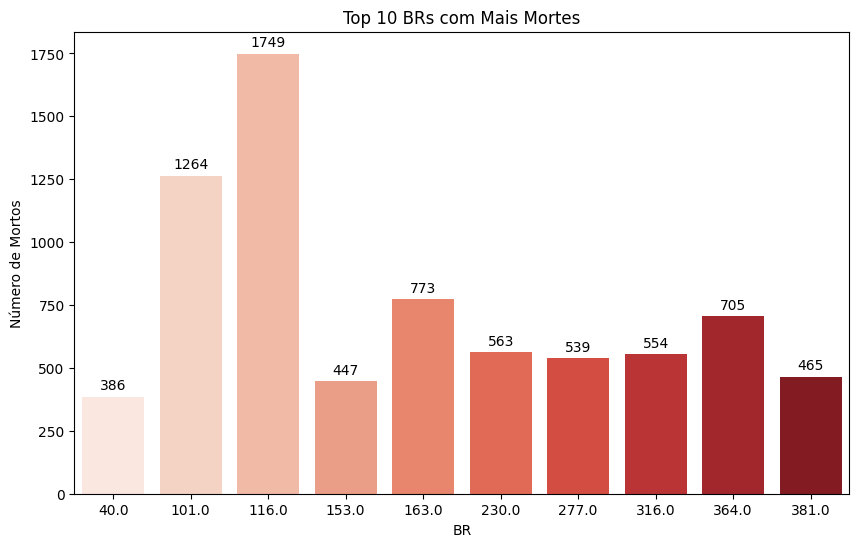

In [50]:
import matplotlib.pyplot as plt

mortos_por_br = data_cleaned.groupby('br')['mortos'].sum().reset_index()


top_br = mortos_por_br.sort_values(by='mortos', ascending=False).head(10)


plt.figure(figsize=(10, 6))
ax = sns.barplot(x='br', y='mortos', data=top_br, palette='Reds')

for i in ax.containers:
    ax.bar_label(i, fmt='%.0f', label_type='edge', padding=3)  

plt.title('Top 10 BRs com Mais Mortes')
plt.xlabel('BR')
plt.ylabel('Número de Mortos')
plt.show()


In [51]:
import folium
from folium.plugins import HeatMap


top_br_data = data_cleaned[data_cleaned['br'].isin(top_br['br'])]


mapa_brasil = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)


heat_data = [[row['latitude'], row['longitude'], row['mortos']] for index, row in top_br_data.iterrows()]


HeatMap(heat_data).add_to(mapa_brasil)


mapa_brasil


In [52]:

data_cleaned


,id,pesid,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_principal,...,feridos_leves,feridos_graves,mortos,latitude,longitude,regional,delegacia,uop,mês,mes_nome
0,571772.0,1268971.0,2024-01-01,segunda-feira,00:05:00,RJ,101.0,"272,5",TANGUA,Sim,...,0.0,0.0,1.0,-22.729360,-42.701125,SPRF-RJ,DEL02-RJ,UOP03-DEL02-RJ,1,Janeiro
1,571774.0,1268985.0,2024-01-01,segunda-feira,00:05:00,GO,153.0,"424,6",ANAPOLIS,Não,...,0.0,0.0,0.0,-16.229185,-49.009797,SPRF-GO,DEL02-GO,UOP01-DEL02-GO,1,Janeiro
2,571774.0,1268985.0,2024-01-01,segunda-feira,00:05:00,GO,153.0,"424,6",ANAPOLIS,Sim,...,0.0,0.0,0.0,-16.229185,-49.009797,SPRF-GO,DEL02-GO,UOP01-DEL02-GO,1,Janeiro
3,571777.0,1269020.0,2024-01-01,segunda-feira,01:45:00,ES,101.0,"264,1",SERRA,Sim,...,0.0,0.0,0.0,-20.172928,-40.267364,SPRF-ES,DEL02-ES,UOP01-DEL02-ES,1,Janeiro
4,571778.0,1269028.0,2024-01-01,segunda-feira,00:45:00,SC,101.0,110,PENHA,Não,...,0.0,0.0,0.0,-26.834770,-48.706151,SPRF-SC,DEL03-SC,UOP02-DEL03-SC,1,Janeiro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343403,621808.0,1392053.0,2024-06-22,sábado,07:15:00,MG,251.0,"479,6",FRANCISCO SA,Sim,...,1.0,0.0,0.0,-16.475060,-43.500301,SPRF-MG,DEL12-MG,UOP01-DEL12-MG,6,Junho
343408,621831.0,1392136.0,2024-07-28,domingo,11:30:00,AL,316.0,262,SATUBA,Não,...,1.0,0.0,0.0,-9.588771,-35.887005,SPRF-AL,DEL02-AL,UOP01-DEL02-AL,7,Julho
343409,621831.0,1392135.0,2024-07-28,domingo,11:30:00,AL,316.0,262,SATUBA,Não,...,0.0,1.0,0.0,-9.588771,-35.887005,SPRF-AL,DEL02-AL,UOP01-DEL02-AL,7,Julho
343410,621831.0,1392136.0,2024-07-28,domingo,11:30:00,AL,316.0,262,SATUBA,Sim,...,1.0,0.0,0.0,-9.588771,-35.887005,SPRF-AL,DEL02-AL,UOP01-DEL02-AL,7,Julho


In [53]:

data_cleaned.to_csv('dados_acidentes.csv', index=False)
